# Projet Machine Learning - Bank Account Fraud

## 1. Préparation et visualisation des données

### 1.1 Préparation du workspace

####   • Import des librairies
Dans un premier temps, on importe les librairies qui nous seront utiles tout au long du projet.

In [82]:
# Données
import pandas as pd
import numpy as np

#Graphiques
import seaborn as sns
sns.set()
import plotly.express as px
import matplotlib.pyplot as plt

#Machine Learning
import sklearn.preprocessing as preproc

#### • Import des données
On importe ensuite nos données.

In [134]:
# Import des données
data_set = pd.read_csv("Base.csv",sep=",",decimal=".",index_col=0)

### 1.2 Observations des données et des variables

Notre étude commence par l'observation des données. Tout d'abord, nous montrons les premières lignes du tableau afin d'identifier les premières tendances et particularités.

In [135]:
# Premières lignes
data_set.head()

,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,velocity_6h,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
fraud_bool,,,,,,,,,,,,,,,,,,,,,
0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,13096.035018,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,9223.283431,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,4471.472149,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,14431.993621,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,7601.511579,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0


In [136]:
# Dimensions
data_set.shape

(1000000, 31)

In [137]:
#Transformer la colonne fraud_bool （index） en une colonne.
data_set = data_set.reset_index()
data_set.head()

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0


Nous disposons de 1000000 données qui représentent des comptes bancaires, et nous disposons de 31 covariables plus de la variable target qui est la colonne fraud_bool, à savoir si c'est fraud ou pas.

In [138]:
# Liste des colonnes
data_set.columns

Index(['fraud_bool', 'income', 'name_email_similarity',
       'prev_address_months_count', 'current_address_months_count',
       'customer_age', 'days_since_request', 'intended_balcon_amount',
       'payment_type', 'zip_count_4w', 'velocity_6h', 'velocity_24h',
       'velocity_4w', 'bank_branch_count_8w',
       'date_of_birth_distinct_emails_4w', 'employment_status',
       'credit_risk_score', 'email_is_free', 'housing_status',
       'phone_home_valid', 'phone_mobile_valid', 'bank_months_count',
       'has_other_cards', 'proposed_credit_limit', 'foreign_request', 'source',
       'session_length_in_minutes', 'device_os', 'keep_alive_session',
       'device_distinct_emails_8w', 'device_fraud_count', 'month'],
      dtype='object')

In [139]:
# Liste des colonnes selon leur type
data_set.dtypes

fraud_bool                            int64
income                              float64
name_email_similarity               float64
prev_address_months_count             int64
current_address_months_count          int64
customer_age                          int64
days_since_request                  float64
intended_balcon_amount              float64
payment_type                         object
zip_count_4w                          int64
velocity_6h                         float64
velocity_24h                        float64
velocity_4w                         float64
bank_branch_count_8w                  int64
date_of_birth_distinct_emails_4w      int64
employment_status                    object
credit_risk_score                     int64
email_is_free                         int64
housing_status                       object
phone_home_valid                      int64
phone_mobile_valid                    int64
bank_months_count                     int64
has_other_cards                 

On observe que la base de données comprend plusieurs variables, dont certaines sont de type numérique (int64， float64) et d'autres variables sont de type object.

Certaines variables sont catégoriques. Par exemple la variable "payment_type" a cinque catégories distinctes (AA, AB, AC, AD, et AE) et 'source' (INTERNET et TELEAPP).

Un résumé des variables est ensuite affiché. Des statistiques descriptives résument les principales caractéristiques de chaque variable, fournissant des indices sur la distribution des données.

In [140]:
# Synthèse des variables
data_set.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
fraud_bool,1000000.0,0.011029,0.104438,0.000000e+00,0.000000,0.000000,0.000000,1.000000
income,1000000.0,0.562696,0.290343,1.000000e-01,0.300000,0.600000,0.800000,0.900000
name_email_similarity,1000000.0,0.493694,0.289125,1.434550e-06,0.225216,0.492153,0.755567,0.999999
prev_address_months_count,1000000.0,16.718568,44.046230,-1.000000e+00,-1.000000,-1.000000,12.000000,383.000000
current_address_months_count,1000000.0,86.587867,88.406599,-1.000000e+00,19.000000,52.000000,130.000000,428.000000
customer_age,1000000.0,33.689080,12.025799,1.000000e+01,20.000000,30.000000,40.000000,90.000000
days_since_request,1000000.0,1.025705,5.381835,4.036860e-09,0.007193,0.015176,0.026331,78.456904
intended_balcon_amount,1000000.0,8.661499,20.236155,-1.553055e+01,-1.181488,-0.830507,4.984176,112.956928
zip_count_4w,1000000.0,1572.692049,1005.374565,1.000000e+00,894.000000,1263.000000,1944.000000,6700.000000
velocity_6h,1000000.0,5665.296605,3009.380665,-1.706031e+02,3436.365848,5319.769349,7680.717827,16715.565404


### 1.3 Analyse de la distribution de la variable cible

In [141]:
# Observation de la distribution de la variable cible
fig = px.histogram(data_set, x = "fraud_bool", nbins=2)
fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(xaxis=dict(tickmode='array',tickvals=[0, 1],ticktext=['0', '1']))
fig.show()

On remarque que les données de la variable cible ne sont pas équilibrées.Le nombre de fraudes représente environ 1,1 % du nombre total.
Cela peut nous poser problème Oversampling lors de la mise en place de nos modèles. Nous nous attaquerons à ce problème après.

## 2. Retraitement des données & Pré-processing 

### 2.1 Data Cleaning

#### • Valeurs doublons
La base de données est générée par le GAN avec un filtre de dulicate, ce qui signifie qu'il n'y a pas de doublon dans l'ensemble de données.

In [142]:
duplicates = data_set[data_set.duplicated(keep=False)] 
print("Duplicate  are:\n", duplicates)

Duplicate  are:
 Empty DataFrame
Columns: [fraud_bool, income, name_email_similarity, prev_address_months_count, current_address_months_count, customer_age, days_since_request, intended_balcon_amount, payment_type, zip_count_4w, velocity_6h, velocity_24h, velocity_4w, bank_branch_count_8w, date_of_birth_distinct_emails_4w, employment_status, credit_risk_score, email_is_free, housing_status, phone_home_valid, phone_mobile_valid, bank_months_count, has_other_cards, proposed_credit_limit, foreign_request, source, session_length_in_minutes, device_os, keep_alive_session, device_distinct_emails_8w, device_fraud_count, month]
Index: []

[0 rows x 32 columns]


#### • Retraitement des valeurs manquantes
On affiche la nombre de valeurs manquantes par variable, ce qui permet de quantifier la qualité des données. Selon le fournisseur de la base de données, pour les colonnes "prev_address_months_count","current_address_months_count","session_length_in_minutes","bank_months_count", et "device_distinct_emails", une valeur de -1 signifie que les données sont manquantes. Pour "intended_balcon_amount", une valeur négative est une donnée manquante.

In [145]:
missing_values_1 = [
    ('prev_address_months_count', -1),
    ('current_address_months_count', -1),
    ('bank_months_count', -1),
    ('device_distinct_emails_8w', -1)
]
# Remplacement des valeurs manquantes spécifiées (par NaN)
for col, missing_value in missing_values_1:
    data_set[col]=data_set[col].replace(missing_value, np.nan)

data_set['session_length_in_minutes'] = pd.to_numeric(data_set['session_length_in_minutes'])
data_set['session_length_in_minutes'] = data_set['session_length_in_minutes'].apply(lambda x:np.nan if x==-1 else x)

data_set['intended_balcon_amount'] = pd.to_numeric(data_set['intended_balcon_amount'])
data_set['intended_balcon_amount'] = data_set['intended_balcon_amount'].apply(lambda x:np.nan if x<0 else x)


In [146]:
# Nombre de NA par variable
nan_count = pd.DataFrame(data_set.isna().sum(), columns=["Nombre_NA"])

# Ajout du % par rapport à la taille de la base de données
nan_count["Pourcentage"]= nan_count.divide(data_set.shape[0])*100

print(nan_count)

                                  Nombre_NA  Pourcentage
fraud_bool                                0       0.0000
income                                    0       0.0000
name_email_similarity                     0       0.0000
prev_address_months_count            712920      71.2920
current_address_months_count           4254       0.4254
customer_age                              0       0.0000
days_since_request                        0       0.0000
intended_balcon_amount               742523      74.2523
payment_type                              0       0.0000
zip_count_4w                              0       0.0000
velocity_6h                               0       0.0000
velocity_24h                              0       0.0000
velocity_4w                               0       0.0000
bank_branch_count_8w                      0       0.0000
date_of_birth_distinct_emails_4w          0       0.0000
employment_status                         0       0.0000
credit_risk_score              

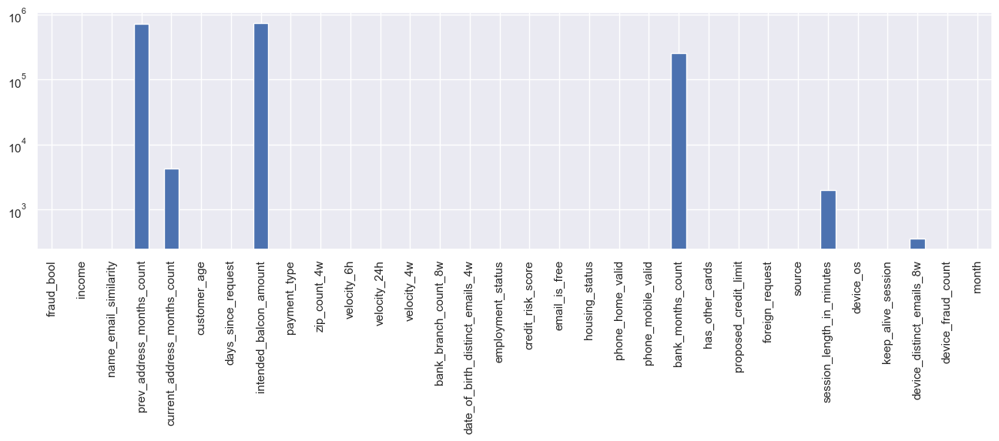

In [147]:
plt.figure(figsize=(16,4))
ax = (len(data_set.index) - data_set.count()).plot.bar()
ax.set_yscale('log') 

- On supprime les caractéristiques pour lesquelles les valeurs manquantes sont supérieures à 1000.

In [148]:
data_set = data_set.drop(data_set.columns[data_set.apply(lambda col: col.isnull().sum() > 1000)], axis=1)

- On supprime toutes les valeurs manquantes de l'ensemble de données

In [149]:
data_set.dropna(inplace=True)
print(data_set.shape)

(999641, 27)


### 2.2 Data Transformation

In [150]:
data_trans = data_set.drop("fraud_bool", axis=1)

- Transformation les variables catégorielles en variables numériques.

In [152]:
# Séparation en variables qualitatives ou catégorielles
variables_numeriques = []
variables_categorielles = []
for col in data_trans.columns:
        if str(data_trans[col].dtypes) in ["int64","float64"]:
            if len(data_trans[col].unique())==2 :
                variables_categorielles.append(data_trans[col])
            else :
                variables_numeriques.append(data_trans[col])
        else :
            if len(data_trans[col].unique())==2 :
                variables_categorielles.append(data_trans[col])
            else :
                variables_categorielles.append(data_trans[col])

In [162]:
# On extrait les variables catégorielles
vars_categorielles = pd.DataFrame(variables_categorielles).transpose()

In [163]:
#One hot encoding des variables catégorielles
preproc_ohe = preproc.OneHotEncoder(handle_unknown='ignore')
preproc_ohe = preproc.OneHotEncoder(drop='first', sparse_output = False).fit(vars_categorielles)

variables_categorielles_ohe = preproc_ohe.transform(vars_categorielles)
variables_categorielles_ohe = pd.DataFrame(variables_categorielles_ohe,
                                           columns = preproc_ohe.get_feature_names_out(vars_categorielles.columns))
variables_categorielles_ohe.head()

,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,employment_status_CF,employment_status_CG,...,phone_home_valid_1,phone_mobile_valid_1,has_other_cards_1,foreign_request_1,source_TELEAPP,device_os_macintosh,device_os_other,device_os_windows,device_os_x11,keep_alive_session_1
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


 - Normalisation des variables numériques

In [ ]:
# On extrait les variables numériques
vars_numeriques = pd.DataFrame(variables_numeriques).transpose()

In [166]:
# Normalisation des variables numériques
preproc_scale = preproc.StandardScaler(with_mean=True, with_std=True)
preproc_scale.fit(vars_numeriques)

vars_numeriques_scaled = preproc_scale.transform(vars_numeriques)
vars_numeriques_scaled = pd.DataFrame(vars_numeriques_scaled,
                            columns = vars_numeriques.columns)
vars_numeriques_scaled.head()

,income,name_email_similarity,customer_age,days_since_request,zip_count_4w,velocity_6h,velocity_24h,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,credit_risk_score,proposed_credit_limit,device_distinct_emails_8w,device_fraud_count,month
0,-0.904887,1.704490,0.524922,-0.189277,-0.510921,2.469203,2.083101,2.050067,-0.390267,-0.894743,0.459403,2.018698,-0.107735,0.0,-1.488144
1,0.817254,0.427941,-1.138203,-0.188652,0.084857,1.182320,0.659554,1.179936,-0.394618,1.687740,0.330238,2.018698,-0.107735,0.0,-1.488144
2,0.817254,1.739772,0.524922,-0.188240,-0.475115,-0.396667,0.474817,1.235258,-0.368512,0.297172,-0.602616,-0.647804,-0.107735,0.0,-1.488144
3,0.128398,-0.064327,-0.306641,-0.189229,1.900041,2.913131,1.342421,1.211105,-0.377214,0.694477,-0.588265,-0.647804,-0.107735,0.0,-1.488144
4,1.161682,1.205743,0.524922,0.876426,0.762194,0.643419,0.239593,1.178924,-0.398970,-0.696091,-0.573913,-0.647804,-0.107735,0.0,-1.488144


### 2.3 Dimention Reduction

Après avoir traité séparément les variables numeriques et les variables categorielles, nous les fusionnons  et choisissons les variables les plus importantes.

In [167]:
# Fusion de toutes les varaibles explicatives
X_all = vars_numeriques_scaled.merge(variables_categorielles_ohe, left_index = True, right_index = True)

In [168]:
X_all.head()

,income,name_email_similarity,customer_age,days_since_request,zip_count_4w,velocity_6h,velocity_24h,velocity_4w,bank_branch_count_8w,date_of_birth_distinct_emails_4w,...,phone_home_valid_1,phone_mobile_valid_1,has_other_cards_1,foreign_request_1,source_TELEAPP,device_os_macintosh,device_os_other,device_os_windows,device_os_x11,keep_alive_session_1
0,-0.904887,1.704490,0.524922,-0.189277,-0.510921,2.469203,2.083101,2.050067,-0.390267,-0.894743,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.817254,0.427941,-1.138203,-0.188652,0.084857,1.182320,0.659554,1.179936,-0.394618,1.687740,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.817254,1.739772,0.524922,-0.188240,-0.475115,-0.396667,0.474817,1.235258,-0.368512,0.297172,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.128398,-0.064327,-0.306641,-0.189229,1.900041,2.913131,1.342421,1.211105,-0.377214,0.694477,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.161682,1.205743,0.524922,0.876426,0.762194,0.643419,0.239593,1.178924,-0.398970,-0.696091,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


## 3. Training et Validation